# Project 3 - EEL4930, Artificial Neural Networks

In this project, you will work with a custom flower species dataset and a car object detection dataset. You will implement artificial neural networks for classification and object detection tasks with ```TensorFlow``` implementations.

The goal of this assignment include:

1. Set up datasets in format needed to run ```TensorFlow``` objects
2. Implement artificial neural networks with ```TensorFlow```
3. Carry out experiments to select best ANN hyperparameters
4. Implement best training practices with ```TensorFlow```, including checkpoints, early stopping, adaptive learning rate
5. Experiment with transfer learning using ```TensorFlow```
6. Implement qualitative and quantitative performance measures
7. Report observations, propose business-centric solutions and propose mitigating strategies

## Deliverables

As part of this project, you should deliver the following materials:

1. [**4-page IEEE-format paper**](https://www.ieee.org/conferences/publishing/templates.html). Write a paper with no more than 4 pages addressing the questions posed below. When writing this report, consider a business-oriented person as your reader (e.g. your PhD advisor, your internship manager, etc.). Tell *the story* for each datasets' goal and propose solutions by addressing (at least) the questions posed below.

2. **Python Code**. Create two separate Notebooks: (1) "training.ipynb" used for training and hyperparameter tuning, (2) "test.ipynb" for evaluating the final trained model in the test set. The "test.ipynb" should load all trained objects and simply evaluate the performance. So don't forget to **push the trained models** to your repository to allow us to run it.

All of your code should run without any errors and be well-documented. 

3. **README.md file**. Edit the readme.md file in your repository and how to use your code. If there are user-defined parameters, your readme.md file must clearly indicate so and demonstrate how to use your code. **Consider the case where the user wants to utilize your code to run on a different test set. Indicate in your readme.md file how this can be achieved.**

This is an **individual assignment**. 

These deliverables are **due Wednesday, December 6 @ 11:59pm**. Late submissions will not be accepted, so please plan accordingly.

---

# Dataset 1: Flower Species Dataset

<div class="alert alert-info">
    <b>Flower Species Dataset</b>
    
Download the [**Flower Species Dataset**](https://ufl.instructure.com/courses/497438/files/folder/flower_species_classification) from Canvas.

</div>

The training dataset is saved as a ```numpy``` array and contains a total of 1678 images from 10 classes. Each RBG image is of size $300\times 300 \times 3$. The 10 classes and its label encodings are:

| Flower Species | Roses | Magnolias | Lilies | Sunflowers | Orchids | Marigold | Hibiscus | Firebush | Pentas | Bougainvillea |
| ---------     | ------| ----------| -------| -----------| --------| ---------| ---------| ---------| -------| --------------|
| Label          |  0    |    1      |    2   |    3       |    4    |    5     |   6      |   7      |   8    |       9       |

In [1]:
class_names = ['Roses', 'Magnolias', 'Lilies', 'Sunflowers', 'Orchids', 
               'Marigold', 'Hibiscus', 'Firebush', 'Pentas', 'Bougainvillea']

The goal is to utilize the training images to train a flower species classifier (an artificial neural network architecture), and make predictions for the test set.

Let's visualize the dataset:

In [10]:
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

# Loading Training Data
X_training = np.load('flower_species_classification/data_train.npy').T
t_training = np.load('flower_species_classification/labels_train.npy')

print(X_training.shape, t_training.shape)

(1658, 270000) (1658,)


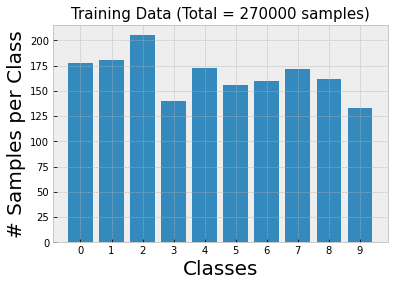

In [14]:
# Counting number samples per class
vals, counts = np.unique(t_training, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(10),range(10))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = '+str(X_training.shape[1])+' samples)',size=15);

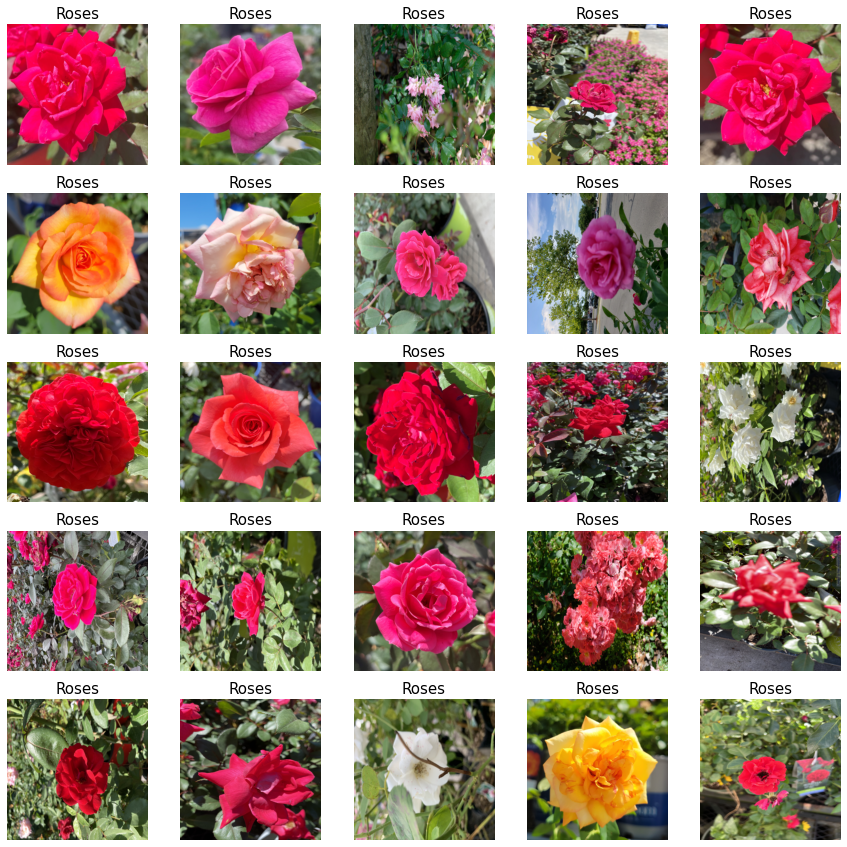

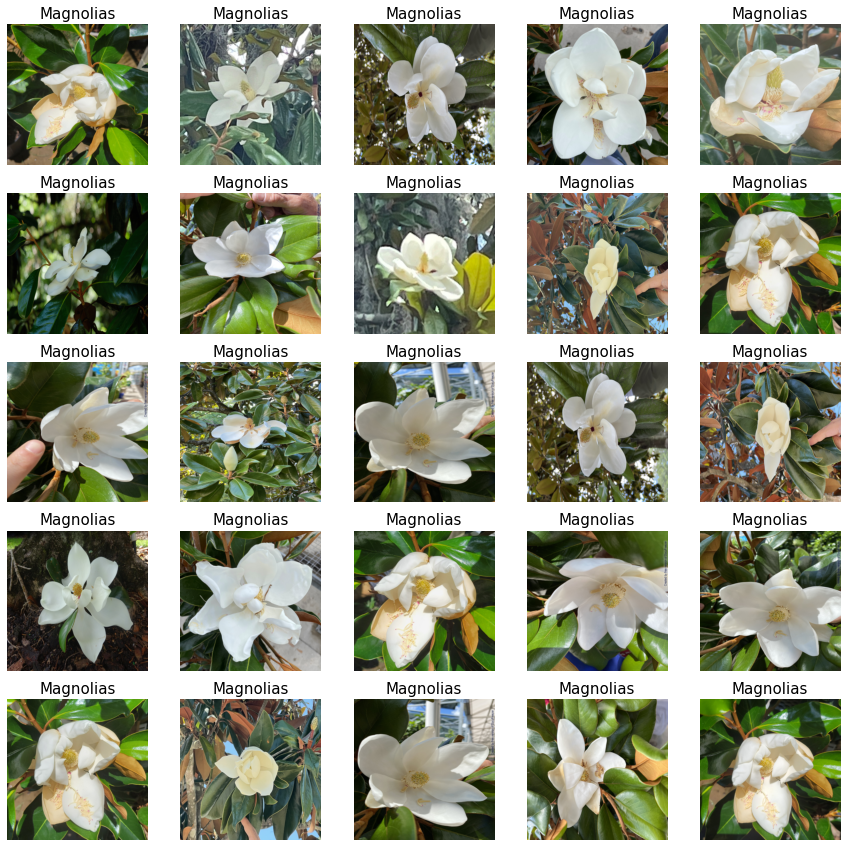

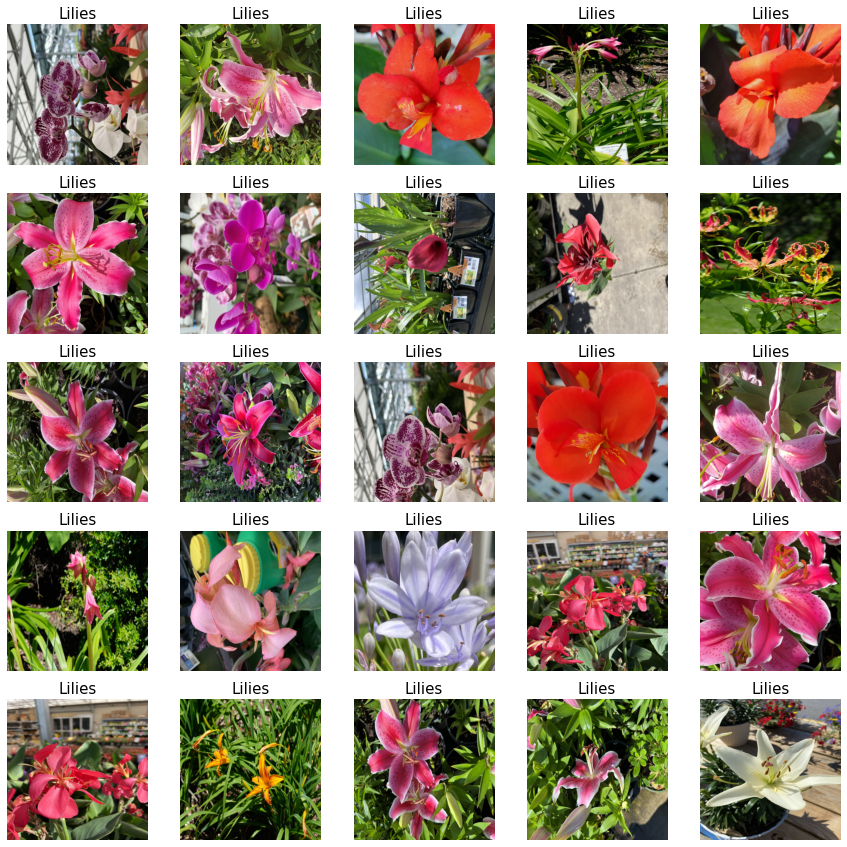

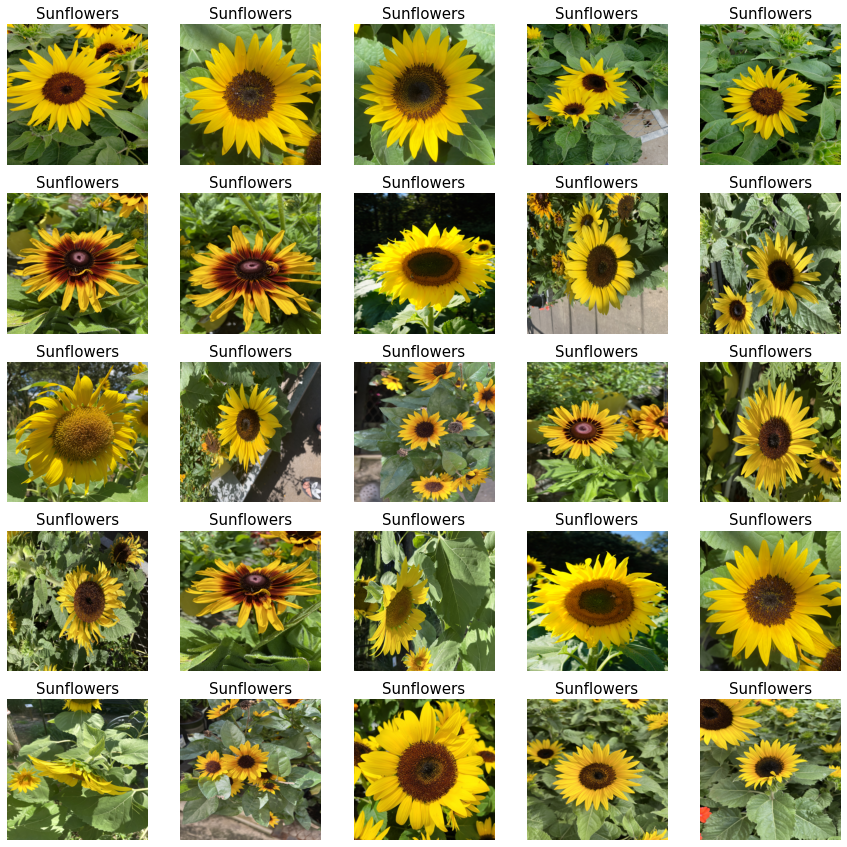

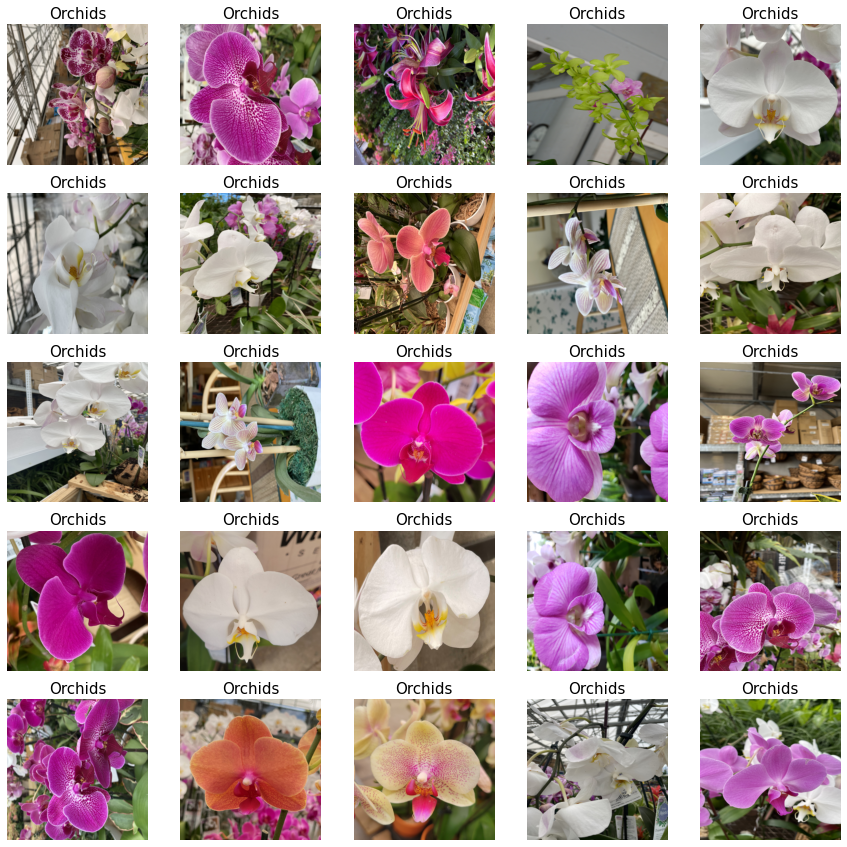

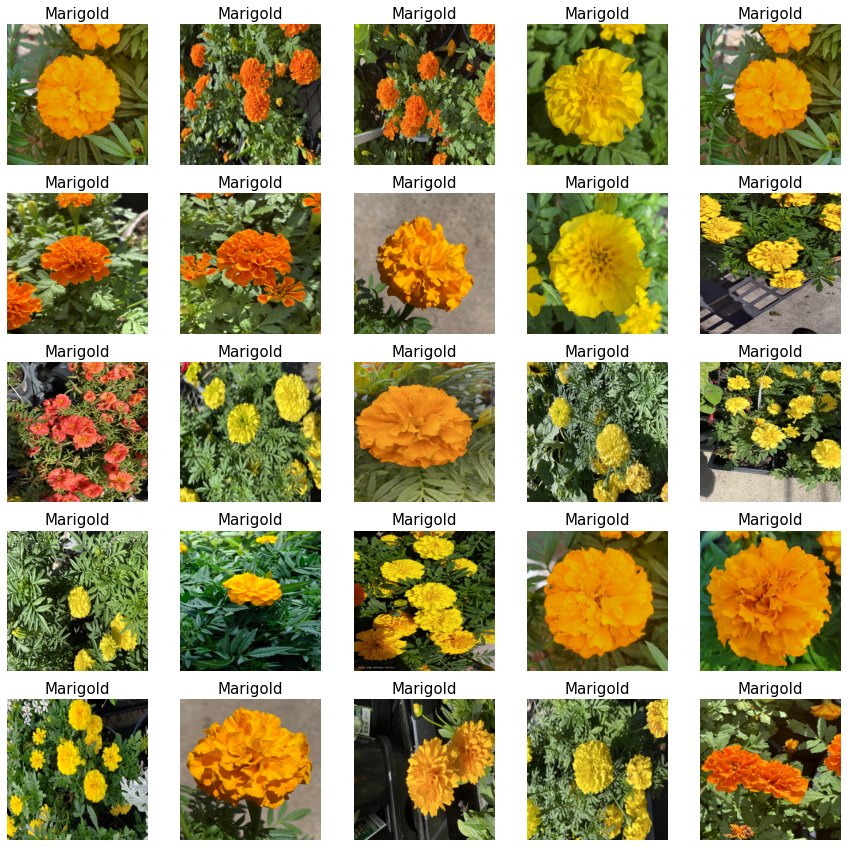

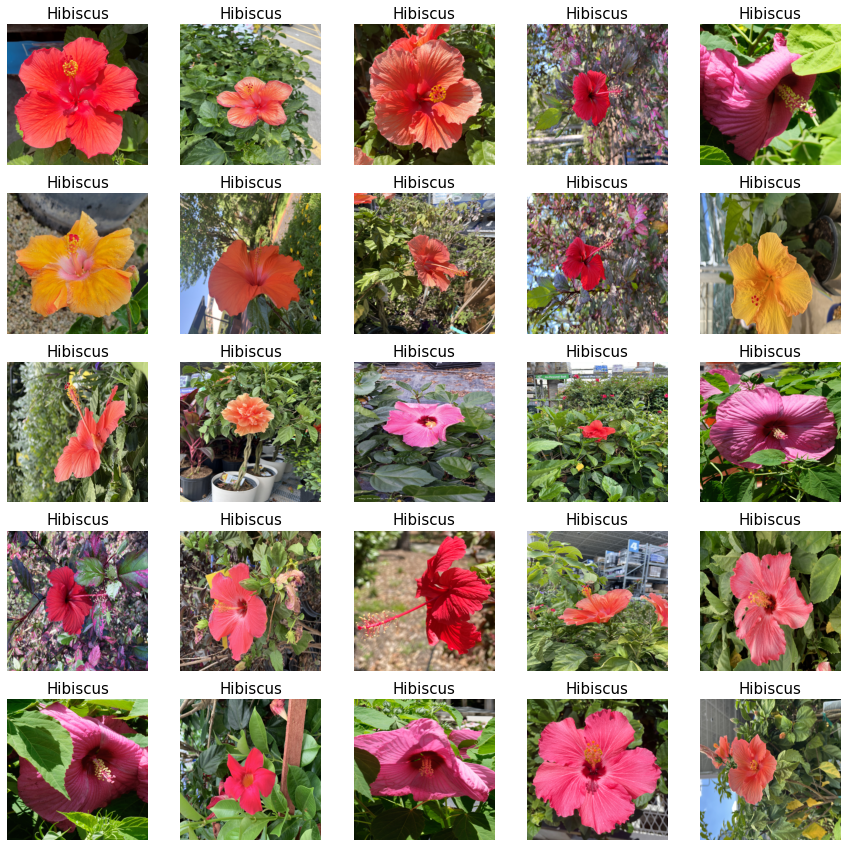

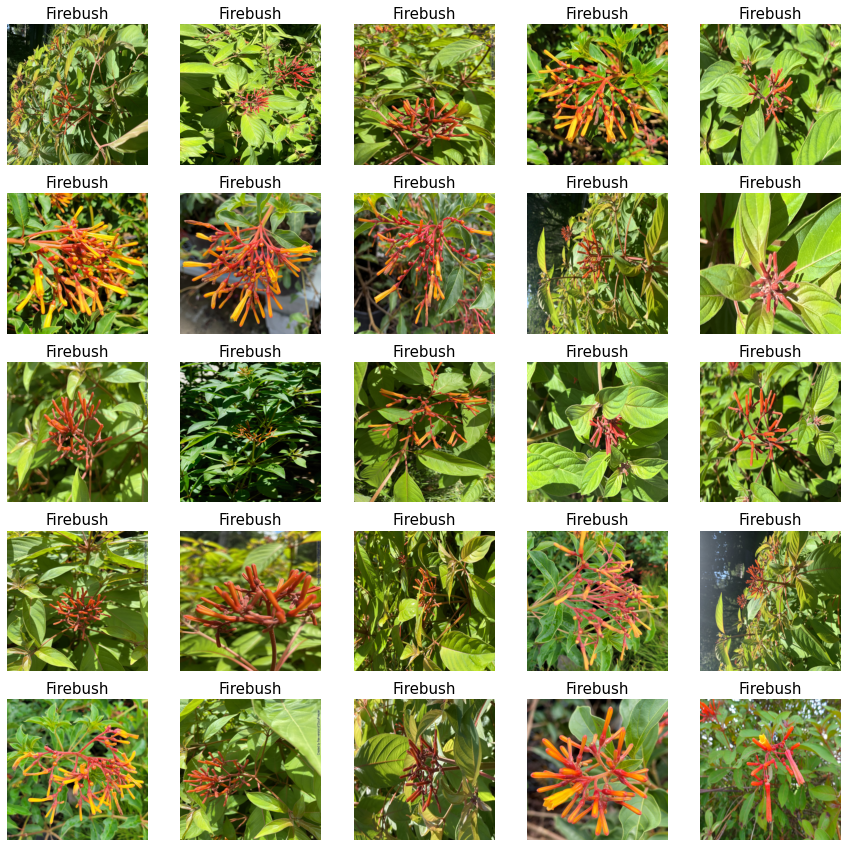

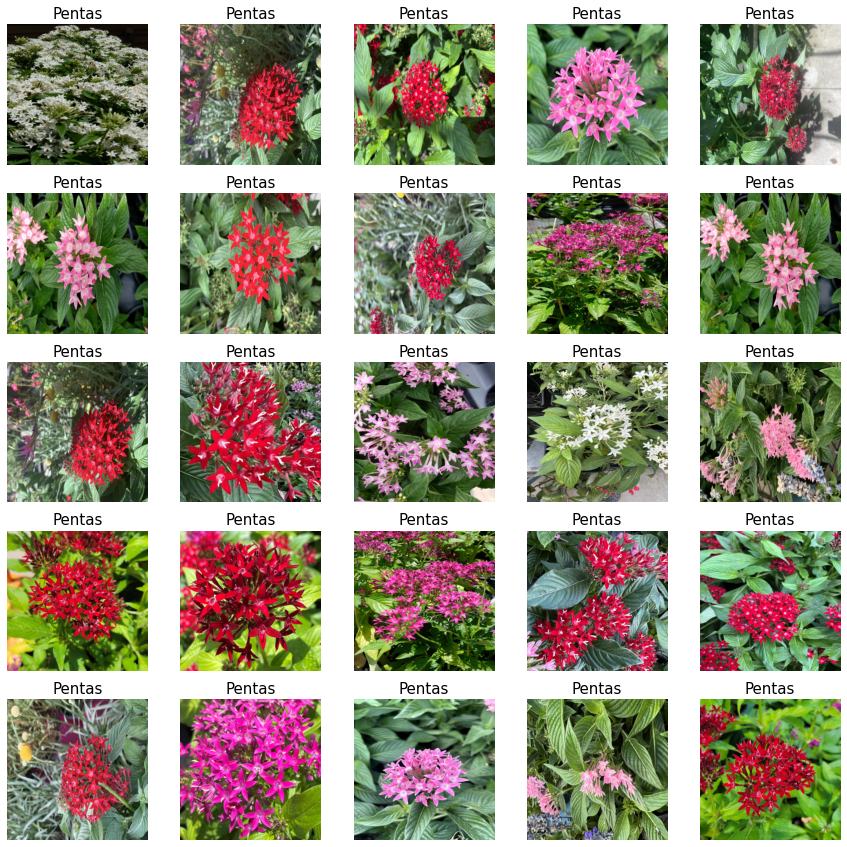

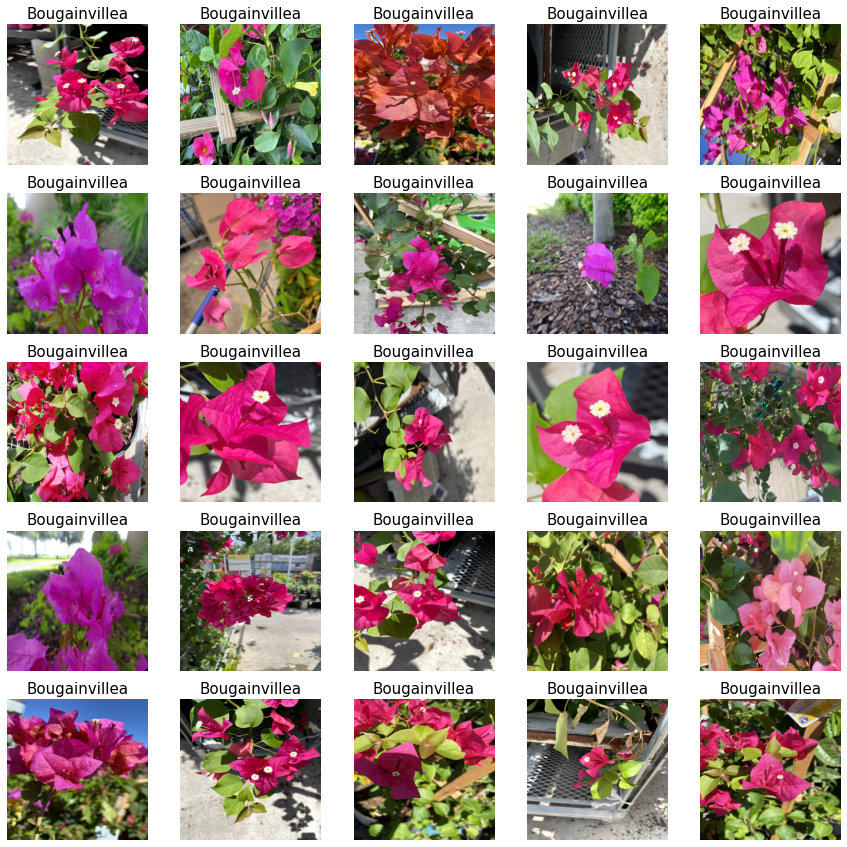

In [15]:
# Displaying some random examples per class

for i in range(0,10):
    rnd_sample = npr.permutation(np.where(t_training==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_training[rnd_sample[j],:].reshape((300,300,3)))
        plt.axis('off');plt.title(class_names[int(t_training[rnd_sample[j]])],size=15)
    plt.show()
    print('\n\n')

## We will start by separating a validation set for training and importing packages.

In [4]:
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import learning_curve

In [11]:
# Train and validation sets
X_train, X_val, t_train, t_val = train_test_split(X_training, 
                                                  t_training, 
                                                  shuffle=True,
                                                  stratify=t_training,
                                                  test_size=0.2,
                                                  random_state=42)

X_training.shape, t_training.shape, X_train.shape, t_train.shape, X_val.shape, t_val.shape

((1658, 270000), (1658,), (1326, 270000), (1326,), (332, 270000), (332,))

In [12]:
del X_training, t_training

In [13]:
X_train_rs = tf.constant(X_train.reshape((X_train.shape[0],300,300,3)), 
                         dtype=tf.float32)

X_train_rs.shape

X_val_rs = tf.constant(X_val.reshape((X_val.shape[0],300,300,3)), 
                       dtype=tf.float32)

X_val_rs.shape

del X_train

del X_val

## First experimented model will be an extension of the one shown in lecture without transfer learning. 

In [99]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=[300,300,3]),
    tf.keras.layers.Dense(300, activation='relu'),
    tf.keras.layers.Dense(75, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])

In [100]:
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
             optimizer=tf.keras.optimizers.Nadam(),
             metrics=['accuracy'])

In [101]:
history = model.fit(X_train_rs, t_train, epochs=30, batch_size=32,
          validation_data=(X_val_rs, t_val),
         callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/30
42/42 [==============================] - 1s 22ms/step - loss: 18852.5586 - accuracy: 0.1365 - val_loss: 11011.3379 - val_accuracy: 0.0843
Epoch 2/30
42/42 [==============================] - 1s 20ms/step - loss: 4760.5308 - accuracy: 0.1998 - val_loss: 2548.6711 - val_accuracy: 0.2620
Epoch 3/30
42/42 [==============================] - 1s 20ms/step - loss: 2342.0386 - accuracy: 0.2745 - val_loss: 2376.0227 - val_accuracy: 0.2048
Epoch 4/30
42/42 [==============================] - 1s 21ms/step - loss: 1889.8522 - accuracy: 0.2926 - val_loss: 3959.3479 - val_accuracy: 0.2229
Epoch 5/30
42/42 [==============================] - 1s 20ms/step - loss: 1479.3772 - accuracy: 0.3348 - val_loss: 802.5205 - val_accuracy: 0.3313
Epoch 6/30
42/42 [==============================] - 1s 20ms/step - loss: 629.5451 - accuracy: 0.4050 - val_loss: 590.7287 - val_accuracy: 0.2620
Epoch 7/30
42/42 [==============================] - 1s 20ms/step - loss: 333.5563 - accuracy: 0.4751 - val_loss: 605.91

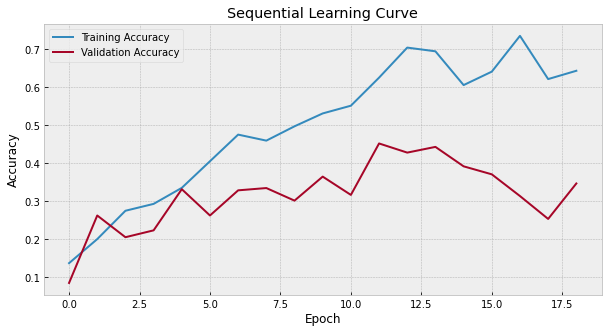

In [102]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Plot the learning curve
plt.figure(figsize=(10, 5))
plt.plot(range(len(train_acc)), train_acc, label='Training Accuracy')
plt.plot(range(len(val_acc)), val_acc, label='Validation Accuracy')
plt.title('Sequential Learning Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

### There is clear overfitting on the training data as potrayed by the low accuracy scores for the validation set.

## Next, we will create a model using transfer learning as encouraged, using Xception as demonstrated in lecture. However, we will experiment with different parameters such as units, layers, etc.

In [17]:
base_model = keras.applications.Xception(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False)  
base_model.trainable = False
# freeze the weights 

In [18]:
# Functional API

IMG_SIZE = 150

inputs = keras.Input(shape=(300, 300, 3))
# Input layer

inputs_resized = tf.keras.layers.Resizing(IMG_SIZE, IMG_SIZE)(inputs)
# resizing input to match pretrained model

x = base_model(inputs_resized, training=False)
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning
inputs.shape, inputs_resized.shape, x.shape

(TensorShape([None, 300, 300, 3]),
 TensorShape([None, 150, 150, 3]),
 TensorShape([None, 5, 5, 2048]))

In [38]:
#Apply L2 regularization (weight decay) with a coefficient of 0.001
x = keras.layers.Lambda(lambda t: keras.layers.Lambda(lambda x: x * 0.9999)(t))(x)  # L2 regularization

# Add Dropout with a rate of 0.5
x = keras.layers.Dropout(0.5)(x)

# Option 1: Pooling

# Convert features of shape `base_model.output_shape[1:]` to vectors
x_pooling = keras.layers.GlobalAveragePooling2D()(x)

x_pooling.shape

TensorShape([None, 2048])

In [39]:
# A Dense classifier with 10 units and softmax activation function
outputs = keras.layers.Dense(10, activation='softmax')(x_pooling)

model2 = keras.Model(inputs, outputs)

In [40]:
model2.compile(optimizer=keras.optimizers.Nadam(),
              loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

history2 = model2.fit(X_train_rs,t_train, epochs=40,
          validation_data=(X_val_rs, t_val),
          callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)], batch_size = 32)

Epoch 1/40
42/42 [==============================] - 3s 35ms/step - loss: 7.2945 - accuracy: 0.1765 - val_loss: 4.4569 - val_accuracy: 0.2349
Epoch 2/40
42/42 [==============================] - 1s 22ms/step - loss: 4.2490 - accuracy: 0.3318 - val_loss: 3.5215 - val_accuracy: 0.3735
Epoch 3/40
42/42 [==============================] - 1s 24ms/step - loss: 3.5908 - accuracy: 0.3741 - val_loss: 4.3909 - val_accuracy: 0.2982
Epoch 4/40
42/42 [==============================] - 1s 23ms/step - loss: 2.9130 - accuracy: 0.4306 - val_loss: 3.0170 - val_accuracy: 0.4066
Epoch 5/40
42/42 [==============================] - 1s 23ms/step - loss: 2.3803 - accuracy: 0.4947 - val_loss: 3.6522 - val_accuracy: 0.3795
Epoch 6/40
42/42 [==============================] - 1s 24ms/step - loss: 2.1356 - accuracy: 0.5468 - val_loss: 4.5499 - val_accuracy: 0.3645
Epoch 7/40
42/42 [==============================] - 1s 23ms/step - loss: 2.0660 - accuracy: 0.5498 - val_loss: 3.0493 - val_accuracy: 0.4518
Epoch 8/40
42

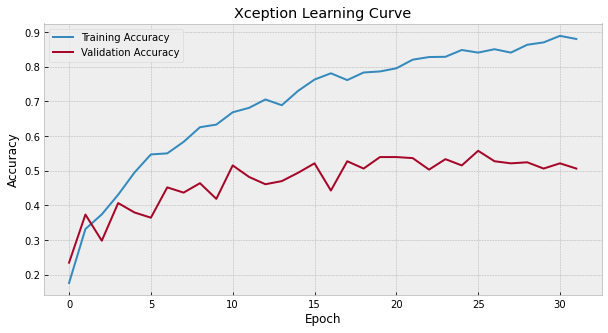

In [41]:
train_acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

# Plot the learning curve
plt.figure(figsize=(10, 5))
plt.plot(range(len(train_acc)), train_acc, label='Training Accuracy')
plt.plot(range(len(val_acc)), val_acc, label='Validation Accuracy')
plt.title('Xception Learning Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

### After experiementing with regularization techniques such as dropout and L2 regularization, and even adjusting batch size, none has had a significant effect on increasing the accuracy of the validation set. There were only decreases of the training set's accuracy. New architectures should be employed.

## We will now be experimenting with the ResNet 152 V2 architecture for transfer learning. 

In [19]:
base_model_res = keras.applications.ResNet152V2(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False)  
base_model_res.trainable = False


In [67]:
# Functional API

x_res = base_model_res(inputs_resized, training=False)
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning
x_pooling_res = keras.layers.GlobalAveragePooling2D()(x_res)

In [68]:
outputs_res = keras.layers.Dense(10, activation='softmax')(x_pooling_res)

model_res = keras.Model(inputs, outputs_res)

In [69]:
model_res.compile(optimizer=keras.optimizers.Nadam(),
              loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

history_res = model_res.fit(X_train_rs,t_train, epochs=40,
          validation_data=(X_val_rs, t_val),
          callbacks=[tf.keras.callbacks.EarlyStopping(patience=8)], batch_size = 32)

Epoch 1/40
42/42 [==============================] - 8s 82ms/step - loss: 121.4229 - accuracy: 0.1456 - val_loss: 160.1187 - val_accuracy: 0.0873
Epoch 2/40
42/42 [==============================] - 2s 39ms/step - loss: 93.2161 - accuracy: 0.2097 - val_loss: 92.3465 - val_accuracy: 0.1687
Epoch 3/40
42/42 [==============================] - 2s 38ms/step - loss: 82.8831 - accuracy: 0.2240 - val_loss: 108.6807 - val_accuracy: 0.2410
Epoch 4/40
42/42 [==============================] - 2s 38ms/step - loss: 87.9276 - accuracy: 0.2285 - val_loss: 114.2170 - val_accuracy: 0.1687
Epoch 5/40
42/42 [==============================] - 2s 38ms/step - loss: 87.6332 - accuracy: 0.2202 - val_loss: 88.1668 - val_accuracy: 0.2500
Epoch 6/40
42/42 [==============================] - 2s 38ms/step - loss: 88.4839 - accuracy: 0.2406 - val_loss: 122.5038 - val_accuracy: 0.2048
Epoch 7/40
42/42 [==============================] - 2s 39ms/step - loss: 75.8158 - accuracy: 0.2760 - val_loss: 85.5746 - val_accuracy: 0

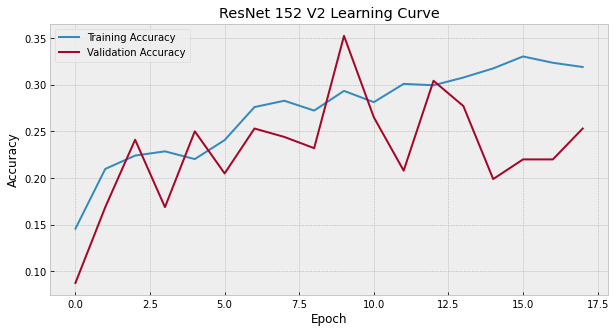

In [70]:
train_acc = history_res.history['accuracy']
val_acc = history_res.history['val_accuracy']

# Plot the learning curve
plt.figure(figsize=(10, 5))
plt.plot(range(len(train_acc)), train_acc, label='Training Accuracy')
plt.plot(range(len(val_acc)), val_acc, label='Validation Accuracy')
plt.title('ResNet 152 V2 Learning Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

## Worse overall performance from using ResNest 152 V2, a much larger and deeper network with many more parameters. We will try experimenting with a significantly less complex architecture.

## We will try using MobileNet due its significantly lower depth, number of parameters, and overall smaller complexity. This is a substantial jump from the previous architectures going from around 23 and 60 million parameters to just 4 million parameters.

In [20]:
base_model_mob = keras.applications.MobileNet(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False,
    dropout=0.5)  
base_model_mob.trainable = False
# freeze the weights 

In [21]:
# Functional API
x_mob = base_model_mob(inputs_resized, training=False)
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning
x_pooling_mob = keras.layers.GlobalAveragePooling2D()(x_mob)

In [22]:
outputs_mob = keras.layers.Dense(10, activation='softmax')(x_pooling_mob)

model_mob = keras.Model(inputs, outputs_mob)

In [23]:
model_mob.compile(optimizer=keras.optimizers.Nadam(),
              loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

history_mob = model_mob.fit(X_train_rs,t_train, epochs=40,
          validation_data=(X_val_rs, t_val),
          callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)], batch_size = 16)

Epoch 1/40


2024-04-24 15:13:54.414243: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201


20/83 [======>.......................] - ETA: 0s - loss: 2.6284 - accuracy: 0.1406

2024-04-24 15:13:58.742340: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


83/83 [==============================] - 8s 17ms/step - loss: 2.0107 - accuracy: 0.3152 - val_loss: 1.4836 - val_accuracy: 0.4819
Epoch 2/40
83/83 [==============================] - 1s 9ms/step - loss: 1.3031 - accuracy: 0.5754 - val_loss: 1.2136 - val_accuracy: 0.5783
Epoch 3/40
83/83 [==============================] - 1s 9ms/step - loss: 1.0676 - accuracy: 0.6531 - val_loss: 1.0850 - val_accuracy: 0.6235
Epoch 4/40
83/83 [==============================] - 1s 9ms/step - loss: 0.9169 - accuracy: 0.7149 - val_loss: 1.0129 - val_accuracy: 0.6476
Epoch 5/40
83/83 [==============================] - 1s 9ms/step - loss: 0.8196 - accuracy: 0.7519 - val_loss: 0.9996 - val_accuracy: 0.6476
Epoch 6/40
83/83 [==============================] - 1s 9ms/step - loss: 0.7315 - accuracy: 0.7919 - val_loss: 0.9418 - val_accuracy: 0.6777
Epoch 7/40
83/83 [==============================] - 1s 9ms/step - loss: 0.6791 - accuracy: 0.7805 - val_loss: 0.9017 - val_accuracy: 0.6898
Epoch 8/40
83/83 [============

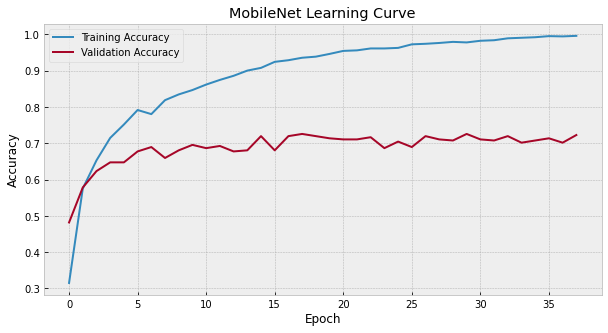

In [24]:
train_acc = history_mob.history['accuracy']
val_acc = history_mob.history['val_accuracy']

# Plot the learning curve
plt.figure(figsize=(10, 5))
plt.plot(range(len(train_acc)), train_acc, label='Training Accuracy')
plt.plot(range(len(val_acc)), val_acc, label='Validation Accuracy')
plt.title('MobileNet Learning Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

### Big breakthrough as we have a higher accuracy on the validation set overall. However, overfitting is still proving to be a persistant issue.

## Conclusion: Could potentially use some higher quality data for training.

### Making base model trainable with small learning rate resulted in extremely low accuracy (10%). Basically no learning.

---

# Dataset 2: Lung Segmentation

<div class="alert alert-info">
    <b>Lung Segmentation Dataset</b>
    
Download the [**Lung Segmentation Dataset**](https://ufl.instructure.com/courses/497438/files/folder/lung_segmentation) from Canvas.

</div>

The dataset contains 704 X-rays and corresponding lung segmentation masks. Each image is grayscale and of shape $512 \times 512$. From these images, 566 are assigned to the training set, and 138 assigned to the test set.

The goal of this problem is to train a neural network to segment the lungs from the X-ray images and compare it with the provided ground truth masks.

Let's load the data:

In [27]:
data_train_lung = np.load('lung_segmentation/data_train.npy')
masks_train = np.load('lung_segmentation/masks_train.npy')

data_test_lung = np.load('lung_segmentation/data_test.npy')
masks_test = np.load('lung_segmentation/masks_test.npy')

data_train_lung.shape, masks_train.shape, data_test_lung.shape, masks_test.shape

((566, 262144), (566, 262144), (138, 262144), (138, 262144))

And now visualize a few of them:

Training Data Examples


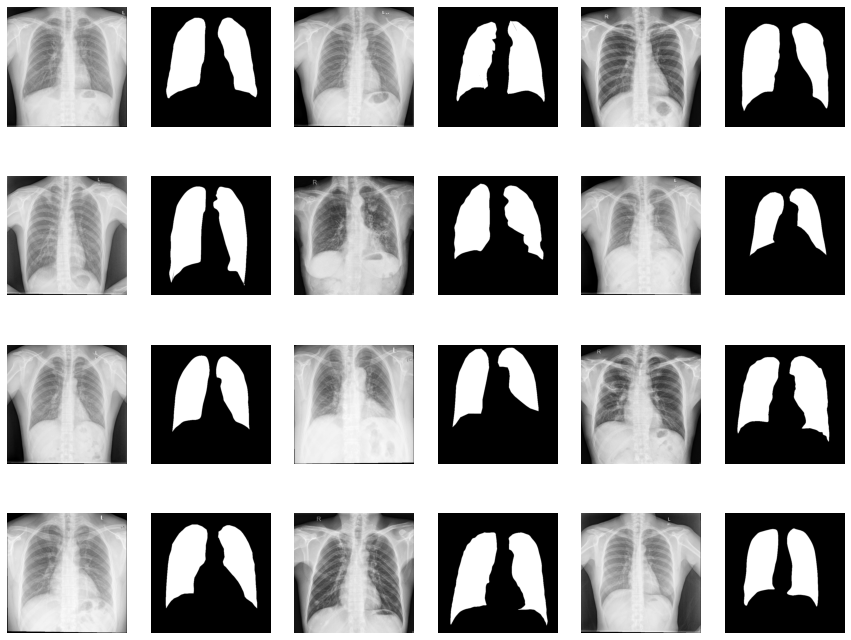

In [4]:
print('Training Data Examples')
plt.figure(figsize=(15,15))
j=1
for i in range(12):
    plt.subplot(5,6,j); plt.imshow(data_train_lung[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.subplot(5,6,j+1); plt.imshow(masks_train[i].reshape(512,512), cmap='gray'); plt.axis('off')
    j+=2

Test Data Examples


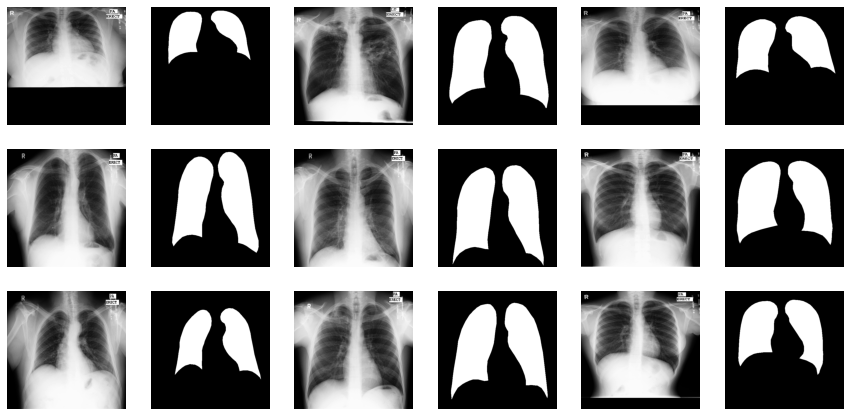

In [5]:
print('Test Data Examples')
plt.figure(figsize=(15,10))
j=1
for i in range(9):
    plt.subplot(4,6,j); plt.imshow(data_test_lung[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.subplot(4,6,j+1); plt.imshow(masks_test[i].reshape(512,512), cmap='gray'); plt.axis('off')
    j+=2

## We will try different types of networks such as an MLP and a CNN for deep learning.

In [28]:
# Reshape images (assuming grayscale with 1 channel)
data_train_lung_reshaped = data_train_lung.reshape(-1, 512, 512, 1)
data_test_lung_reshaped = data_test_lung.reshape(-1, 512, 512, 1)
# Normalize pixel intensities (optional, but recommended)
data_train_lung_reshaped = data_train_lung_reshaped / 255.0  # Assuming pixel values are 0-255
data_test_lung_reshaped = data_test_lung_reshaped / 255.0
# Convert masks to binary format (0 - background, 1 - lung)
masks_train_binary = masks_train > 0.5  # Thresholding for binary classification
masks_test_binary = masks_test > 0.5

In [29]:
print(masks_test_binary.shape,
masks_train_binary.shape)

(138, 262144) (566, 262144)


In [30]:
masks_test_binary = masks_test_binary.reshape(138, 512, 512)
masks_train_binary = masks_train_binary.reshape(566, 512, 512)

In [31]:
# Train and validation sets
X_train, X_val, t_train, t_val = train_test_split(data_train_lung_reshaped, 
                                                  masks_train_binary, 
                                                  shuffle=True,
                                                  test_size=0.2,
                                                  random_state=42)

X_train.shape, X_val.shape, t_train.shape, t_val.shape

((452, 512, 512, 1), (114, 512, 512, 1), (452, 512, 512), (114, 512, 512))

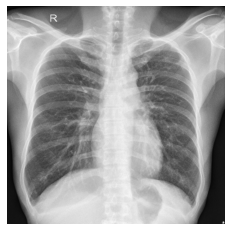

(-0.5, 511.5, 511.5, -0.5)

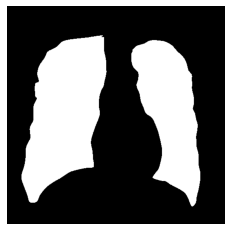

In [38]:
plt.subplot(1,1,1); plt.imshow(X_train[150].reshape(512,512), cmap='gray'); plt.axis('off')
plt.show()
plt.subplot(1,1,1); plt.imshow(t_train[150].reshape(512,512), cmap='gray'); plt.axis('off')

### We will start with a simple MLP made with the Sequential API, testing various architectures.

### We will use the sigmoid activation function as the output because our goal is binary classification of each pixel to segment the lungs. Additionally, the binary corss entropy loss function will be used since we aim to find the probability that each pixel is one of two classes, lung or no lung.

In [17]:
model_seq = tf.keras.models.Sequential([
    tf.keras.layers.Dense(100, activation='relu',  input_shape=(512, 512, 1)),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dense(25, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [18]:
model_seq.compile(loss = tf.keras.losses.BinaryCrossentropy(), optimizer = tf.keras.optimizers.Nadam(), metrics = keras.metrics.MeanSquaredError())

history_seq = model_seq.fit(X_train, t_train, epochs=30, batch_size=32,
          validation_data=(X_val, t_val), callbacks=[tf.keras.callbacks.EarlyStopping(patience=5, monitor="val_mean_squared_error")])

Epoch 1/30
15/15 [==============================] - 3s 150ms/step - loss: 0.6865 - mean_squared_error: 0.2467 - val_loss: 0.6624 - val_mean_squared_error: 0.2346
Epoch 2/30
15/15 [==============================] - 2s 126ms/step - loss: 0.6447 - mean_squared_error: 0.2259 - val_loss: 0.6220 - val_mean_squared_error: 0.2148
Epoch 3/30
15/15 [==============================] - 2s 126ms/step - loss: 0.5972 - mean_squared_error: 0.2031 - val_loss: 0.5737 - val_mean_squared_error: 0.1928
Epoch 4/30
15/15 [==============================] - 2s 132ms/step - loss: 0.5578 - mean_squared_error: 0.1862 - val_loss: 0.5563 - val_mean_squared_error: 0.1866
Epoch 5/30
15/15 [==============================] - 2s 127ms/step - loss: 0.5490 - mean_squared_error: 0.1835 - val_loss: 0.5541 - val_mean_squared_error: 0.1860
Epoch 6/30
15/15 [==============================] - 2s 128ms/step - loss: 0.5462 - mean_squared_error: 0.1823 - val_loss: 0.5505 - val_mean_squared_error: 0.1844
Epoch 7/30
15/15 [==========

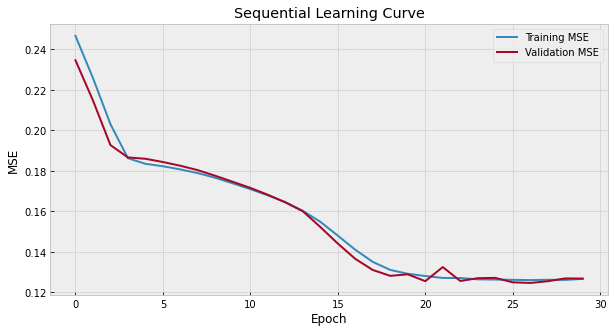

In [19]:
train_acc = history_seq.history['mean_squared_error']
val_acc = history_seq.history['val_mean_squared_error']

# Plot the learning curve
plt.figure(figsize=(10, 5))
plt.plot(range(len(train_acc)), train_acc, label='Training MSE')
plt.plot(range(len(val_acc)), val_acc, label='Validation MSE')
plt.title('Sequential Learning Curve')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()

### Pretty good results for basic network. Any smaller network performed worse, only 50% accuracy.

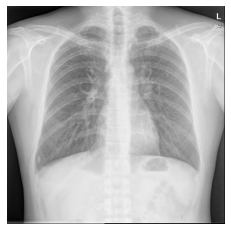

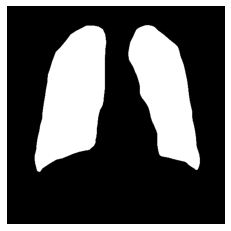

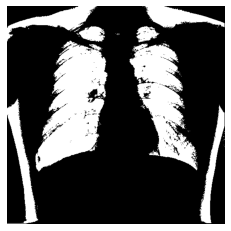

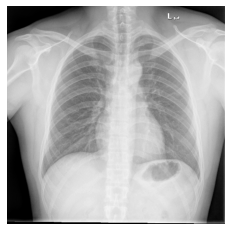

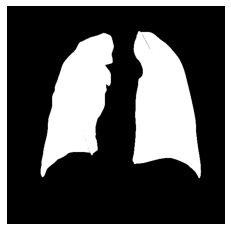

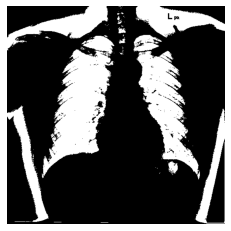

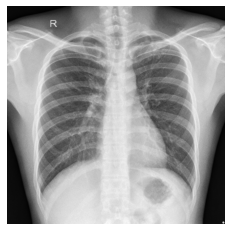

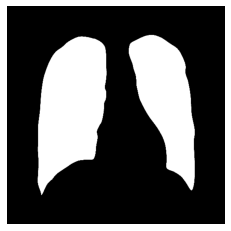

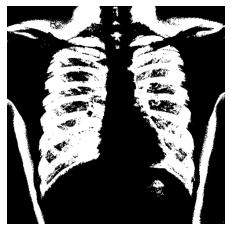

In [52]:
predicted_masks = model_seq.predict(data_train_lung_reshaped[:5])
predicted_masks_reshaped = predicted_masks.reshape(-1, 512, 512)
threshold = 0.50  # Adjust threshold as needed
predicted_masks_binary = predicted_masks_reshaped > threshold
num_images = 3  # Number of sample images

for i in range(num_images):
    # Load original image, predicted mask, and ground truth mask
    plt.subplot(); plt.imshow(data_train_lung[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.show()
    plt.subplot(); plt.imshow(masks_train[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.show()
    plt.subplot(); plt.imshow(predicted_masks_binary[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.show()

In [26]:
#print(predicted_masks)

### This network appears to be outlining even torso edges in the image, and leaves some the inside of the lungs misclassified.

## Onto a convolutional neural network.

In [32]:
model_cnn = keras.models.Sequential([
    keras.layers.Input(shape=(512,512,1)),
    keras.layers.AveragePooling2D(pool_size = (4, 4),strides=(4, 4), padding="same"),
    keras.layers.Conv2D(128, 3, activation='relu', padding='same'),
    keras.layers.Conv2D(64, 3, activation='relu', padding='same'),
    keras.layers.Conv2D(32, 3, activation='relu', padding='same'),
    keras.layers.Conv2D(8, 3, activation='relu', padding='same'),
    keras.layers.UpSampling2D(size = (4,4)),
    keras.layers.Conv2D(1, (1, 1), activation='sigmoid')
])

model_cnn.compile(loss = tf.keras.losses.BinaryCrossentropy(), optimizer = tf.keras.optimizers.Nadam(), metrics = ['mean_squared_error'])

history_cnn = model_cnn.fit(X_train, t_train, epochs=200, batch_size=8,
          validation_data=(X_val, t_val), callbacks=[tf.keras.callbacks.EarlyStopping(patience=10, monitor = 'val_mean_squared_error')])

Epoch 1/200
57/57 [==============================] - 3s 19ms/step - loss: 0.4916 - mean_squared_error: 0.1646 - val_loss: 0.4167 - val_mean_squared_error: 0.1387
Epoch 2/200
57/57 [==============================] - 1s 10ms/step - loss: 0.3707 - mean_squared_error: 0.1196 - val_loss: 0.2858 - val_mean_squared_error: 0.0864
Epoch 3/200
57/57 [==============================] - 1s 10ms/step - loss: 0.3013 - mean_squared_error: 0.0939 - val_loss: 0.3505 - val_mean_squared_error: 0.1079
Epoch 4/200
57/57 [==============================] - 1s 10ms/step - loss: 0.2820 - mean_squared_error: 0.0871 - val_loss: 0.3036 - val_mean_squared_error: 0.0937
Epoch 5/200
57/57 [==============================] - 1s 10ms/step - loss: 0.2658 - mean_squared_error: 0.0812 - val_loss: 0.2341 - val_mean_squared_error: 0.0700
Epoch 6/200
57/57 [==============================] - 1s 10ms/step - loss: 0.2561 - mean_squared_error: 0.0781 - val_loss: 0.2446 - val_mean_squared_error: 0.0729
Epoch 7/200
57/57 [=========

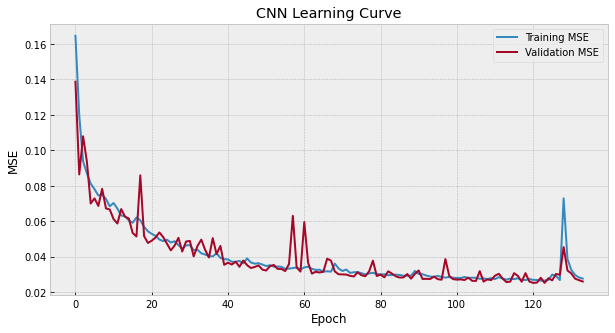

In [33]:
train_acc = history_cnn.history['mean_squared_error']
val_acc = history_cnn.history['val_mean_squared_error']

# Plot the learning curve
plt.figure(figsize=(10, 5))
plt.plot(range(len(train_acc)), train_acc, label='Training MSE')
plt.plot(range(len(val_acc)), val_acc, label='Validation MSE')
plt.title('CNN Learning Curve')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()

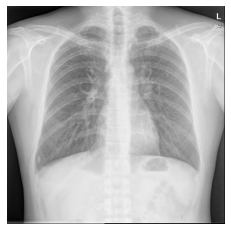

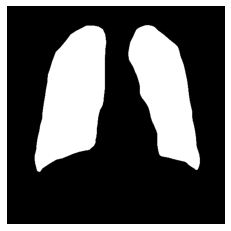

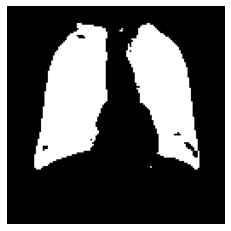

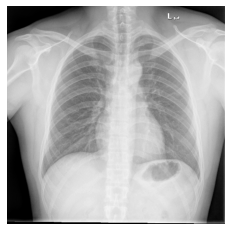

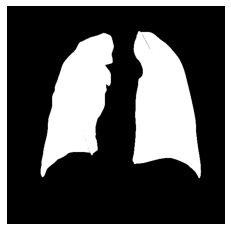

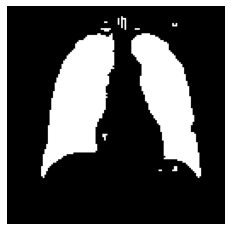

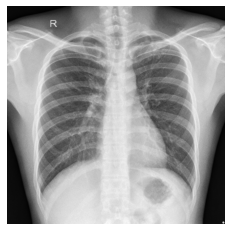

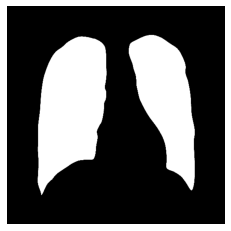

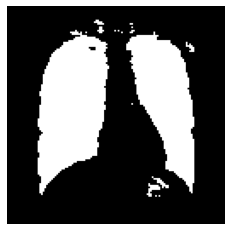

In [34]:
predicted_masks = model_cnn.predict(data_train_lung_reshaped[:5])
predicted_masks_reshaped = predicted_masks.reshape(-1, 512, 512)
threshold = 0.50  # Adjust threshold as needed
predicted_masks_binary = predicted_masks_reshaped > threshold
num_images = 3  # Number of sample images

for i in range(num_images):
    # Load original image, predicted mask, and ground truth mask
    plt.subplot(); plt.imshow(data_train_lung[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.show()
    plt.subplot(); plt.imshow(masks_train[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.show()
    plt.subplot(); plt.imshow(predicted_masks_binary[i].reshape(512,512), cmap='gray'); plt.axis('off')
    plt.show()

## The convolutional network provided a much better solutions with lower MSE rates as expected due to their ability to capture spatial relationships and added ability of avoiding overfitting. We have managed to not capture any extra edges of the torso and shoulders with more accuracte lung segmentation after heavy hyperparameter tuning of the number of layers, filters, stride, batch size, etc.

In [35]:
model_cnn.save('model_cnn.keras')

In [25]:
model_mob.save('model_mob.keras')

---

# Assignment

1. Train an artificial neural network for **flower species classification** using the training set of dataset 1.
   
    * Experiment with several hyperparameters of the network.
    
    * You are welcome to use any architecture or approach you wish, but I encourage you to use transfer learning.
    
    * Report performance results in training, validation and test sets.
    
    * Display the learning curves.

---

2. Train an artificial neural network for the **lung segmentation** using the training set of dataset 2.

    * Identify the correct architecture and objective function for performing lung segmentation. Justify your choices.
    
    * Experiment with several hyperparameters of the network.
    
    * Report performance results in training, validation and test sets.
    
    * Display the learning curves.

---

### Test Function

Your test Notebook should include:

1. Loading trained models from problems 1 and 3.

    * If the models are too big (which is to be expect especially if you are using transfer learning), upload the models' weights to a cloud service (like Google Drive or Dropbox). Share the link in your readme.md file.
    
2. Make predictions to the respective test sets.

3. Include any necessary visualizations to include in the report.

---

# Submit Your Solution

Confirm that you've successfully completed the assignment.

Along with the Notebook, include a PDF of the notebook with your solutions.

```add``` and ```commit``` the final version of your work, and ```push``` your code to your GitHub repository.

Submit the URL of your GitHub Repository as your assignment submission on Canvas.

---